Load packages

In [1]:
from copy import deepcopy
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

Load data and Combine

In [3]:
train = pd.read_csv("./datasets/train.csv")
test = pd.read_csv("./datasets/test.csv")
dfcombined = pd.concat([train, test], ignore_index = True)

Drop rows and columns with only nans

In [4]:
dfcombined = dfcombined.dropna(axis =  1, how = "all")
dfcombined = dfcombined.dropna(axis =  0, how = "all")

Get overview of NaNs

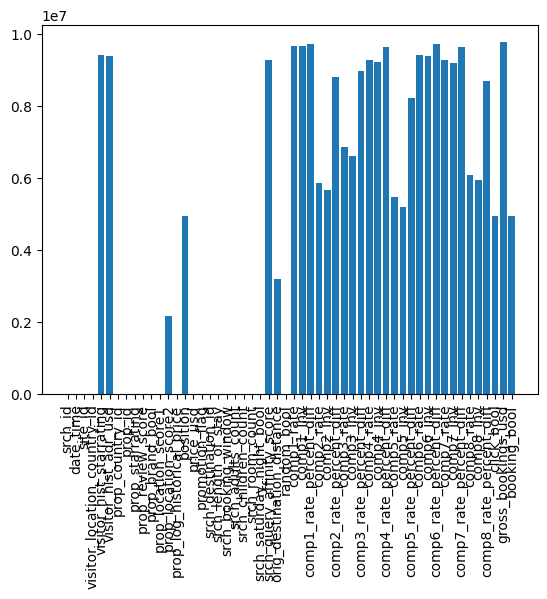

In [5]:
plt.bar(dfcombined.columns, np.sum(dfcombined.isna(), axis = 0))
plt.xticks(rotation = 90)
plt.show()

### Outlier Removal

price_usd

In [6]:
def testing(data, q, direction):
    """
        Goal:
            Get the ratio between the samples and the ... percentile.
                This value can be changed. Problem with lower values
                occurs for hotels with two types of rooms.
        ------------------------------------------------------------
        Input:
            data:
                price_usd column, pd.Series
            q:
                Quantile, float
            direction
                Direction, str
        ------------------------------------------------------------
        Output:
            data"""
    # Get ratio
    if data.size > 10: # Because otherwise not enough information
        # Get quantile
        quantile = data.quantile(q = q)
        # Check conditions
        if direction.lower() == "higher":
            while sum(data > quantile) < 2: # Just one datapoint
                q = q - 0.01
                quantile = data.quantile(q = q)
                if (q - 0.01) < 0:
                    break
        elif direction.lower() == "lower":
            while sum(data < quantile) < 2: # Just one datapoint
                q = q + 0.01
                quantile = data.quantile(q = q)
                if (q + 0.01) > 1:
                    break
        # Get ratio
        data = data / quantile
        # Correct for NaNs
        if direction.lower() == "lower":
            data = data.fillna(math.inf)
        elif direction.lower() == "higher":
            data = data.fillna(-math.inf)

    elif direction.lower() == "lower":
        data = data * math.inf
    elif direction.lower() == "higher":
        data = data * -math.inf
    return data

# ---- Set zero to NaN
dfcombined.loc[dfcombined["price_usd"] == 0, "price_usd"] = np.nan

# ---- Normalize to length of stay --> assumed that this will lead to price/night (we have to make assumptions!)
dfcombined["price_normalized"] = dfcombined["price_usd"] / dfcombined["srch_length_of_stay"] #* (dfcombined["srch_adults_count"] + dfcombined["srch_children_count"]))

# ---- Create deepcopy
data = deepcopy(dfcombined)

# ---- Get fractions
dtest = data.groupby("prop_id")["price_usd"].transform(testing, 0.05, "lower") # Boundaries can be adapted --> 5 percentile
dtest2 = data.groupby("prop_id")["price_normalized"].transform(testing, 0.05, "lower")

# ----- Filter for minimum --> retain non-outliers
data = data[np.logical_and(dtest > 0.2, dtest2 > 0.2)] # Boundaries can be adapted  --> 5 times or less as small

In [7]:
# ---- Get fractions
dtest3 = data.groupby("prop_country_id")["price_usd"].transform(testing, 0.01, "lower")
dtest4 = data.groupby("prop_country_id")["price_normalized"].transform(testing, 0.01, "lower")

# ---- Filter for minimum --> retain non-outliers
data = data[np.logical_and(dtest3 > 0.2, dtest4 > 0.2)] # 5 times or less as cheap

In [8]:
# ---- Get fractions
data["prop_bool"] = data.groupby("prop_id")[["price_usd"]].transform(testing, 0.98, "higher") # By prop id
data["prop_bool2"] = data.groupby("prop_id")[["price_normalized"]].transform(testing, 0.98, "higher") # By prop id, normalized

# ---- Price as well as normalized, because normalized --> save non-outliers
data = data.loc[np.logical_and(data["prop_bool2"] < 2, data["prop_bool"] < 2), :] # Smaller than two times 98% percentile seems save

# ---- Remove searches with unrealistic high prices
lows = data[data["price_normalized"] <= 300000] # Unrealisticly high --> most expensive hotel per night according to GOOGLE hahahaha?
data = data.loc[lows.index, :]

# ---- Search destination and starrating --> assumed that kind of equal hotels in searches
data["srch_bool"] = data.groupby(["srch_id"])[["price_usd"]].transform(testing, 0.98, "higher")
data = data.loc[(data["srch_bool"] < 5), :] 

# ---- Search destination --> similar prices in same segment
data["srchdest_bool"] = data.groupby(["srch_destination_id", "prop_starrating"])["price_normalized"].transform(testing, 0.98, "higher")
data = data.loc[data["srchdest_bool"] < 5, :]

# ---- Get indices
dfcombined.loc[[idx for idx in dfcombined.index if idx not in data.index], "price_usd"] = np.nan
dfcombined = dfcombined.drop(columns = "price_normalized")

Plots

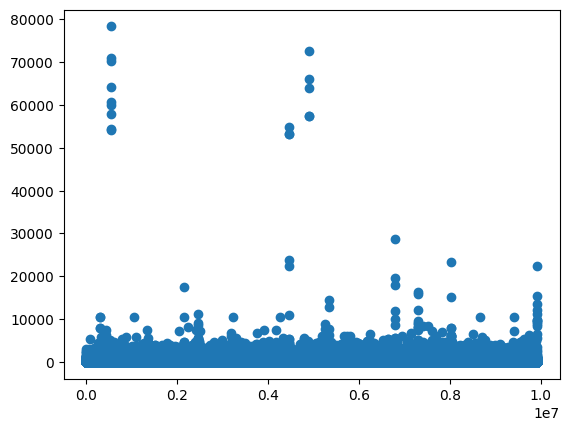

In [9]:
plt.plot(dfcombined["price_usd"], "o")
plt.show()

Gross_bookings_usd

In [10]:
# Set zeros to NaN
dfcombined.loc[dfcombined["gross_bookings_usd"] == 0, "gross_bookings_usd"] = np.nan

# Get normalized
dfcombined["gross_bookings normalized"] = dfcombined["gross_bookings_usd"] / dfcombined["srch_length_of_stay"]

# Deepcopy
data = deepcopy(dfcombined)

# Lower and Upper
subselection = data[data["gross_bookings normalized"] > 0]
test1 = subselection.groupby(["prop_id"])["gross_bookings normalized"].transform(testing, 0.02, "lower")
test2 = subselection.groupby(["prop_id"])["gross_bookings normalized"].transform(testing, 0.98, "higher")

# Select
test1 = test1[test1 < 0.2]
test2 = test2[test2 > 2]
data = data.loc[[idx for idx in data.index if idx not in test1.index], :]
data = data.loc[[idx for idx in data.index if idx not in test2.index], :]

# Lower and Upper
subselection = data[data["gross_bookings normalized"] > 0]
test3 = subselection.groupby(["prop_country_id"])["gross_bookings normalized"].transform(testing, 0.02, "lower")
test4 = subselection.groupby(["prop_country_id"])["gross_bookings normalized"].transform(testing, 0.98, "higher")

# Select
test3 = test3[test3 < 0.2]
test4 = test4[test4 > 2]
data = data.loc[[idx for idx in data.index if idx not in test3.index], :]
data = data.loc[[idx for idx in data.index if idx not in test4.index], :]

# Get indices
dfcombined.loc[[idx for idx in dfcombined.index if idx not in data.index], "gross_bookings_usd"] = np.nan
dfcombined = dfcombined.drop(columns = "gross_bookings normalized")

visitor_hist_adr_usd --> historic price misses, historic stars not. All on some days so glitch

In [11]:
# Lets impute it with the median for a hotel in that search region with that amount of stars (historic)
def imphistadr(x):
    """Goal:
        Impute visitor_hist_adr_usd
    --------------------------------
    Input:
        x:
            Row, Pandas Series
    --------------------------------
    Output:
        x"""
    if x["visitor_hist_adr_usd"] == 0:
        fillframe = dfcombined[dfcombined["srch_destination_id"] == x["srch_destination_id"]]
        fillframe = fillframe[fillframe["prop_starrating"] == round(x["visitor_hist_starrating"])]
        fillframe = fillframe[fillframe["prop_starrating"] != 0]
        try:
            x["visitor_hist_adr_usd"] = fillframe["visitor_hist_adr_usd"].median()
        except: # Overall median
            x["visitor_hist_adr_usd"] = dfcombined["visitor_hist_adr_usd"].median()
    return x

# Get new values
new_vals = dfcombined.loc[dfcombined["visitor_hist_adr_usd"] == 0, :].transform(lambda x: imphistadr(x), axis = 1)

# Fill
for idx in new_vals.index:
    dfcombined.loc[idx, :] = new_vals.loc[idx, :]

# Imputation

visitor_hist_starrating

In [12]:
# ------ Difference
# Get difference between visitor and hotel rating
dfcombined["diff starrating"] = dfcombined["visitor_hist_starrating"] - dfcombined["prop_starrating"]
# Save nans in a bool
dfcombined["bool miss visitor starrating"] = dfcombined["diff starrating"].isna()
# Fill nans with zero --> no difference
dfcombined["diff starrating"] = dfcombined["diff starrating"].fillna(value = 0)

visitor_hist_adr_usd

In [13]:
# ------ New users
bool_newusers = dfcombined["visitor_hist_starrating"].isna() + dfcombined["visitor_hist_adr_usd"].isna()
bool_newusers = np.where(bool_newusers == 1, 0, bool_newusers)
bool_newusers = np.where(bool_newusers == 2, 1, bool_newusers)
dfcombined["bool new users"] = bool_newusers

# ------ Get difference between visitor and hote price
dfcombined["diff hotel price"] = dfcombined["visitor_hist_adr_usd"] - dfcombined["price_usd"]
# Save nans in a bool
dfcombined["bool miss visitor hotel price"] = dfcombined["diff hotel price"].isna()
# Fill nans with zero --> no difference
dfcombined["diff hotel price"] = dfcombined["diff hotel price"].fillna(value = 0)
# Remove
dfcombined = dfcombined.drop("visitor_hist_starrating", axis = 1)
dfcombined = dfcombined.drop("visitor_hist_adr_usd", axis = 1)

prop_review_score

In [14]:
# Bool missing
dfcombined["bool review unknown"] = dfcombined["prop_review_score"].isna() # Checked it, and everything before is also nan. So not randomly missing
dfcombined["bool review absent"] = np.where(dfcombined["prop_review_score"] == 0, 1, 0)

# Fill nans with zero, no information seems related to missingness?
dfcombined["prop_review_score"] = dfcombined["prop_review_score"].fillna(0)

prop_location_score2

In [15]:
# ----- Save missing values in bool
dfcombined["bool miss prop_location_score2"] = dfcombined["prop_location_score2"].isna()

# ----- Impute
# First round, try on worst score for the hotel --> worst 25%
dfcombined["prop_location_score2"] = dfcombined.groupby("prop_id")["prop_location_score2"].transform(lambda group: group.fillna(group.quantile(0.25)))
# Second round, impute based on destination id --> worst 25%
dfcombined["prop_location_score2"] = dfcombined.groupby("srch_destination_id")["prop_location_score2"].transform(lambda group: group.fillna(group.quantile(0.25)))
# Third round, impute based on country --> worst 25%
dfcombined["prop_location_score2"] = dfcombined.groupby("prop_country_id")["prop_location_score2"].transform(lambda group: group.fillna(group.quantile(0.25)))

srch_query_affinity_score

In [16]:
# Save missing values to bool
dfcombined["bool miss srch_query_affinity_score"] = dfcombined["srch_query_affinity_score"].isna()

# Impute with 100 times the minimum log value, as zeros will reach towards -infinity
dfcombined.loc[:, "srch_query_affinity_score"] = dfcombined["srch_query_affinity_score"].fillna(dfcombined["srch_query_affinity_score"].min() * 100)

orig_destination_distance

In [17]:
# Save missing values to bool
dfcombined["bool miss orig_destination_distance"] = dfcombined["orig_destination_distance"].isna()

# Save raw
rawdest = deepcopy(dfcombined["orig_destination_distance"])

# ---- Impute
# First round: Impute by median of visitor loaction and srch destination
dfcombined["orig_destination_distance"] = dfcombined.groupby(["visitor_location_country_id", "srch_destination_id"])["orig_destination_distance"].transform(lambda group: group.fillna(group.median()))
# Second round: Impute by median of visitor location and hotel country
dfcombined["orig_destination_distance"] = dfcombined.groupby(["visitor_location_country_id", "prop_country_id"])["orig_destination_distance"].transform(lambda group: group.fillna(group.median()))
# Third round: Impute by median of srch destination location
dfcombined["orig_destination_distance"] = dfcombined.groupby(["srch_destination_id"])["orig_destination_distance"].transform(lambda group: group.fillna(group.median()))
# Fourth round: Impute by median of hotel country
dfcombined["orig_destination_distance"] = dfcombined.groupby(["prop_country_id"])["orig_destination_distance"].transform(lambda group: group.fillna(group.median()))
# Fifth round: Impute by overall median
dfcombined["orig_destination_distance"] = dfcombined["orig_destination_distance"].fillna(rawdest.median())

C:\Users\niels\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\niels\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\niels\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\niels\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
 

Competitor information

In [18]:
# Impute with zero
for icomp in range(1, 9):
    # Get  columns
    col1 = "comp" + str(icomp) + "_rate"
    col2 = "comp" + str(icomp) + "_inv"
    col3 = "comp" + str(icomp) + "_rate_percent_diff"
    # Fill nans with zeros
    for col in [col1, col2, col3]:
        dfcombined.loc[:, col] = dfcombined[col].fillna(0)


price_usd

In [19]:
dfcombined["bool missing price_usd"] = dfcombined.loc[:, 'price_usd'].isna()
dfcombined.loc[:, 'price_usd'] = dfcombined['price_usd'].fillna(dfcombined.groupby(["srch_id"])['price_usd'].transform('median'))
dfcombined.loc[:, 'price_usd'] = dfcombined['price_usd'].fillna(dfcombined.groupby(["prop_id", "srch_length_of_stay"])['price_usd'].transform('median'))
dfcombined.loc[:, 'price_usd'] = dfcombined['price_usd'].fillna(dfcombined.groupby(["srch_destination_id", "srch_length_of_stay"])['price_usd'].transform('median'))
dfcombined.loc[:, 'price_usd'] = dfcombined['price_usd'].fillna(dfcombined.groupby(["prop_id"])['price_usd'].transform('median'))

gross_bookings_usd

In [20]:
subset = dfcombined.loc[dfcombined["booking_bool"] == 1, :]
dfcombined.loc[dfcombined["booking_bool"] == 1, "gross_bookings_usd"] = subset["gross_bookings_usd"].fillna(subset.groupby(["prop_id", "srch_length_of_stay"])["gross_bookings_usd"].transform('median'))
dfcombined.loc[dfcombined["booking_bool"] == 1, "gross_bookings_usd"] = subset["gross_bookings_usd"].fillna(subset.groupby(["srch_destination_id", "srch_length_of_stay"])["gross_bookings_usd"].transform('median'))
dfcombined.loc[dfcombined["booking_bool"] == 1, "gross_bookings_usd"] = subset["gross_bookings_usd"].fillna(subset.groupby(["prop_country_id", "srch_length_of_stay"])["gross_bookings_usd"].transform('median'))
dfcombined.loc[dfcombined["booking_bool"] == 1, "gross_bookings_usd"] = subset["gross_bookings_usd"].fillna(subset.groupby(["prop_country_id"])["gross_bookings_usd"].transform('median'))

# Impute no booking with 0
dfcombined.loc[dfcombined["booking_bool"] == 0, "gross_bookings_usd"] = dfcombined.loc[dfcombined["booking_bool"] == 0, "gross_bookings_usd"].fillna(0)

Get Train and Test set

In [21]:
train = dfcombined[~dfcombined["booking_bool"].isna()]
test = dfcombined[dfcombined["booking_bool"].isna()]

In [22]:
train.to_csv("./datasets/train_imputed.csv", index = False)
test.to_csv("./datasets/test_imputed.csv", index = False)